## S-FFSD.csv

S-FFSD.csv loaded successfully!


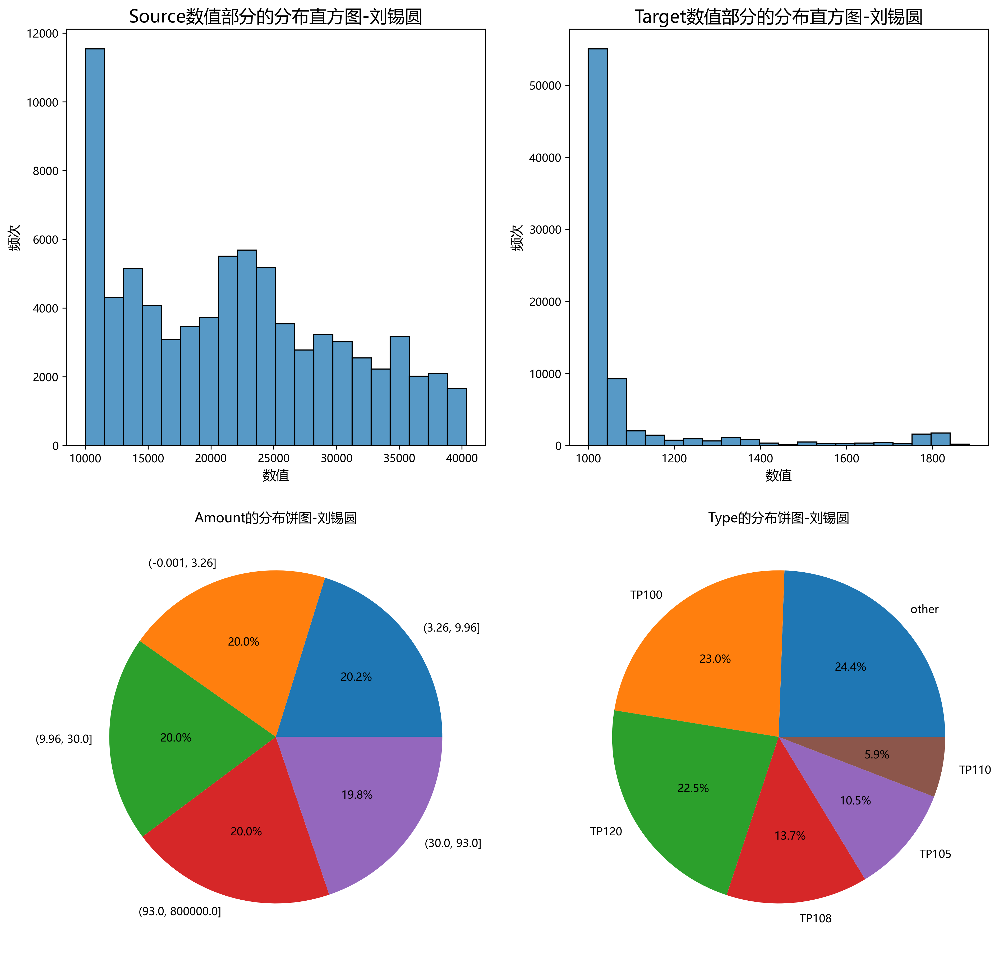

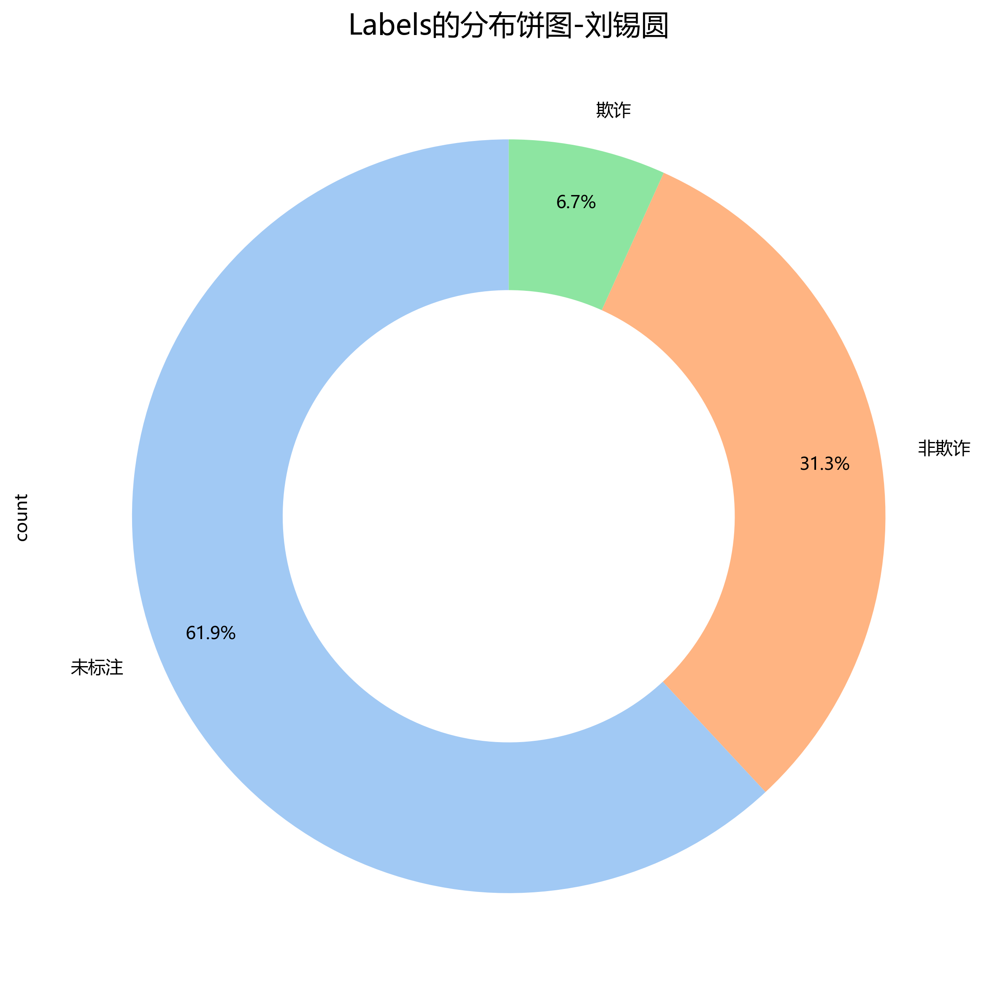

In [1]:
import scipy.io
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd # For easier feature plotting
import re

plt.rcParams['figure.dpi'] = 300
plt.rcParams['font.sans-serif'] = ['Microsoft YaHei']   # Set font to Microsoft YaHei for Chinese characters
plt.rcParams['axes.unicode_minus'] = False # Ensure minus sign displays correctly

try:
    df = pd.read_csv('./data/S-FFSD.csv')
    print("S-FFSD.csv loaded successfully!")
except FileNotFoundError:
    print("Error: S-FFSD.csv not found. Make sure the file is in './data/'.")
    exit()

df['Source_Num'] = df['Source'].apply(lambda x: int(re.search(r'\d+', x).group()))
df['Target_Num'] = df['Target'].apply(lambda x: int(re.search(r'\d+', x).group()))

type_counts = df['Type'].value_counts()
total_count = len(df)
type_percentages = type_counts / total_count
df['Type'] = df['Type'].apply(lambda x: 'other' if type_percentages[x] < 0.05 else x)

fig, axes = plt.subplots(2, 2, figsize=(15, 15))

sns.histplot(df['Source_Num'], bins=20, kde=False, ax=axes[0, 0])
axes[0, 0].set_title('Source数值部分的分布直方图-刘锡圆', fontsize=16)
axes[0, 0].set_xlabel('数值', fontsize=12)
axes[0, 0].set_ylabel('频次', fontsize=12)

sns.histplot(df['Target_Num'], bins=20, kde=False, ax=axes[0, 1])
axes[0, 1].set_title('Target数值部分的分布直方图-刘锡圆', fontsize=16)
axes[0, 1].set_xlabel('数值', fontsize=12)
axes[0, 1].set_ylabel('频次', fontsize=12)
amount_bins = pd.qcut(df['Amount'], q=5)
amount_bin_counts = amount_bins.value_counts()
amount_bin_counts.plot(kind='pie', autopct='%1.1f%%', ax=axes[1, 0])

axes[1, 0].set_title('Amount的分布饼图-刘锡圆')
axes[1, 0].set_ylabel('')
type_counts_updated = df['Type'].value_counts()

type_counts_updated.plot(kind='pie', autopct='%1.1f%%', ax=axes[1, 1])

axes[1, 1].set_title('Type的分布饼图-刘锡圆')

axes[1, 1].set_ylabel('')

plt.figure(figsize=(8, 8)) 
labels_for_plot = df['Labels'].map({0: '非欺诈', 1: '欺诈', 2: '未标注'}) 
labels_counts = labels_for_plot.value_counts()

labels_counts.plot(kind='pie', autopct='%1.1f%%', startangle=90, colors=sns.color_palette("pastel"),
                   pctdistance=0.85, wedgeprops=dict(width=0.4)) # Add styling for a donut chart
plt.title('Labels的分布饼图-刘锡圆', fontsize=16)
plt.tight_layout() 
plt.show() # Display the first figure

# --- New: Add pie chart for 'Labels' ---


## YelpChi.mat
三种边类型（关系矩阵）：
R-U-R（同一用户发布的评论）
R-S-R（具有相同星级评分的同一产品下的评论）
R-T-R（在同一产品下同一月份发布的评论）
（横纵轴是评论）
homo是三者的合并矩阵

features是特征矩阵，label是0或1表示欺诈与否

In [2]:

plt.rcParams['font.sans-serif'] = ['Microsoft YaHei']  
plt.rcParams['axes.unicode_minus'] = False
# Load the .mat file
try:
    yelp_data = scipy.io.loadmat('./data/YelpChi.mat')
    print("Data loaded successfully!")
    print("Available keys:", yelp_data.keys())
except FileNotFoundError:
    print("Error: YelpChi.mat not found.")
    exit()

homo_matrix = yelp_data['homo']
net_rur_matrix = yelp_data['net_rur']
net_rsr_matrix = yelp_data['net_rsr']
net_rtr_matrix = yelp_data['net_rtr']
features_matrix = yelp_data['features']
labels = yelp_data['label'].flatten() # Ensure labels are a 1D arraylabels are a 1D array

Data loaded successfully!
Available keys: dict_keys(['__header__', '__version__', '__globals__', 'homo', 'net_rur', 'net_rtr', 'net_rsr', 'features', 'label'])


### 关系矩阵的热力图-YelpChi.mat

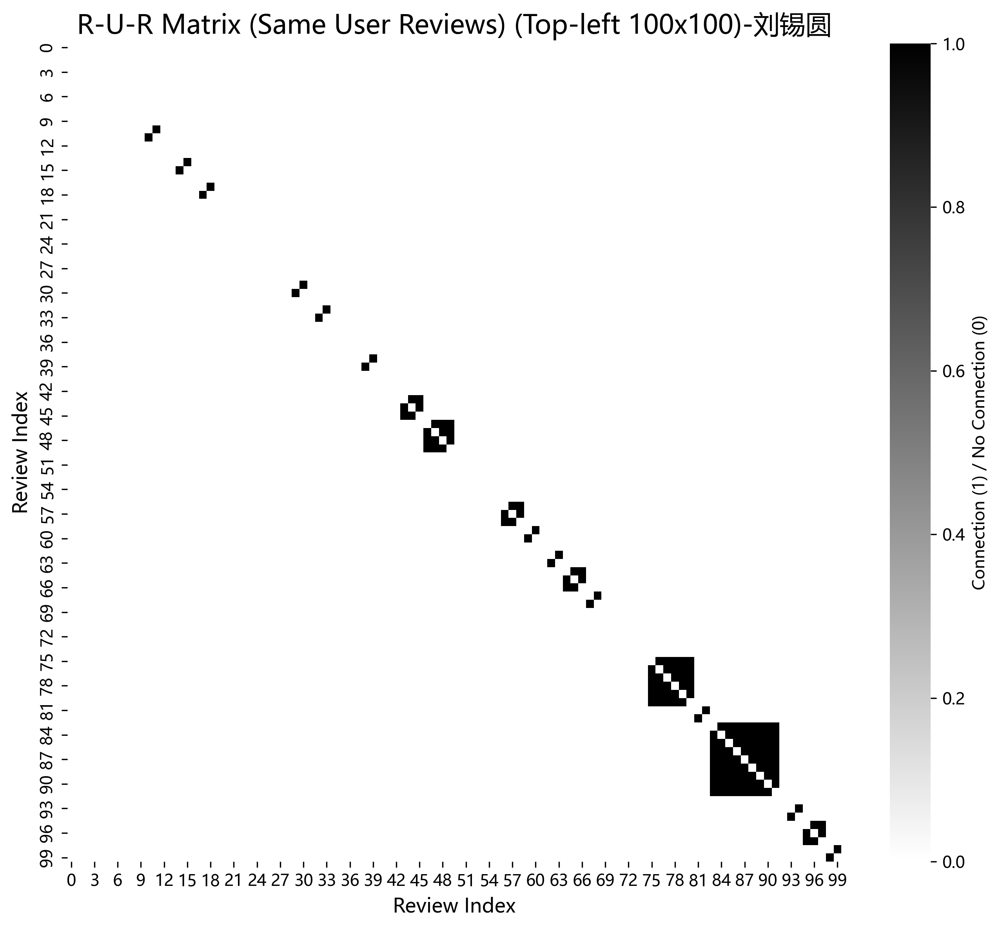

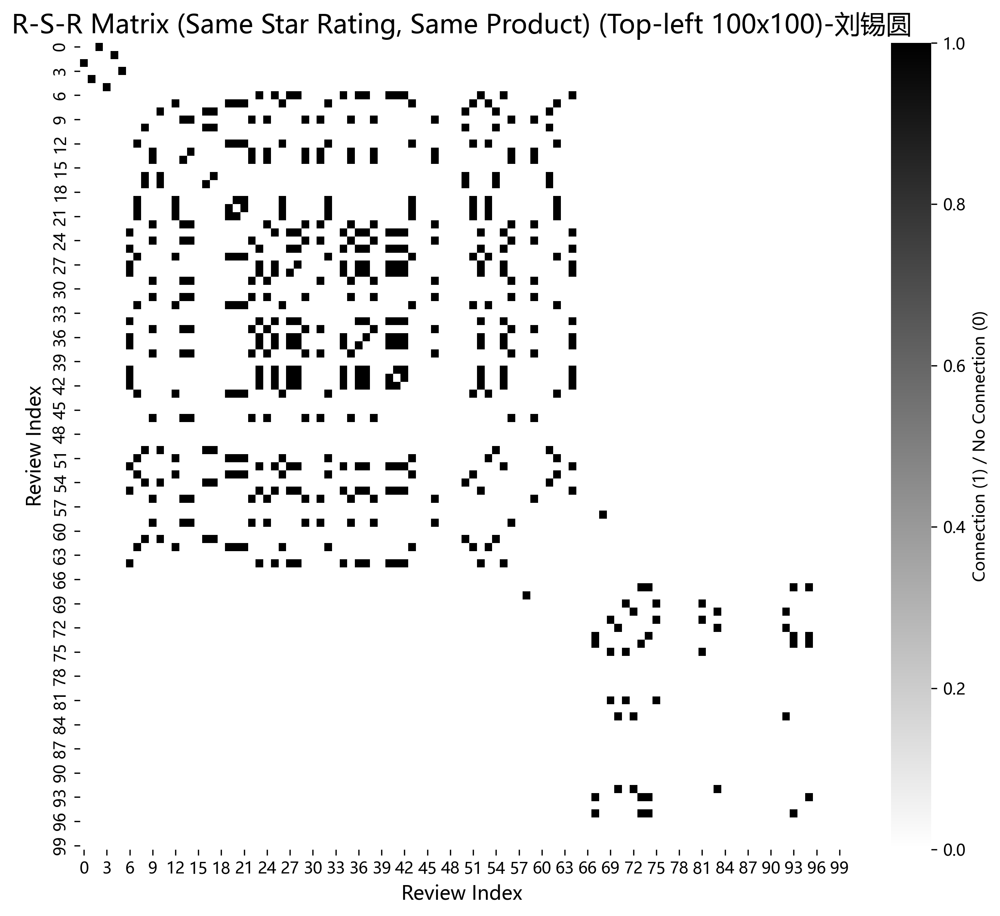

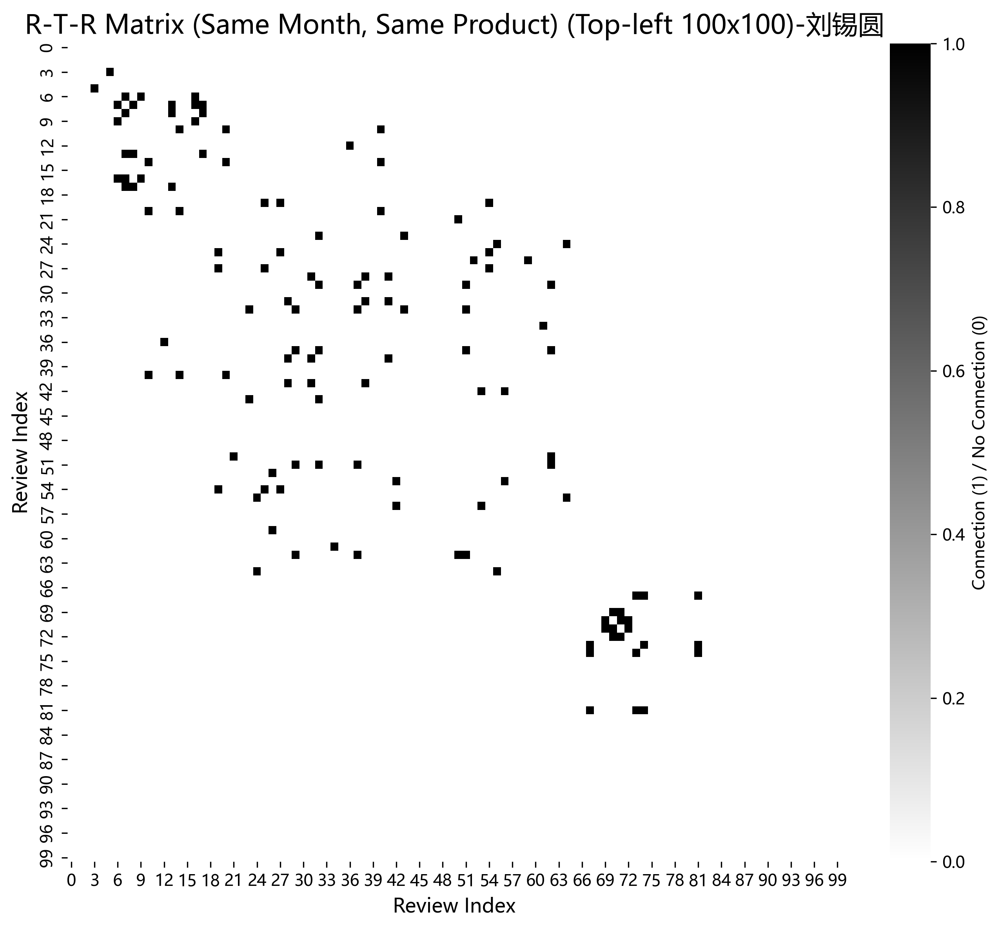

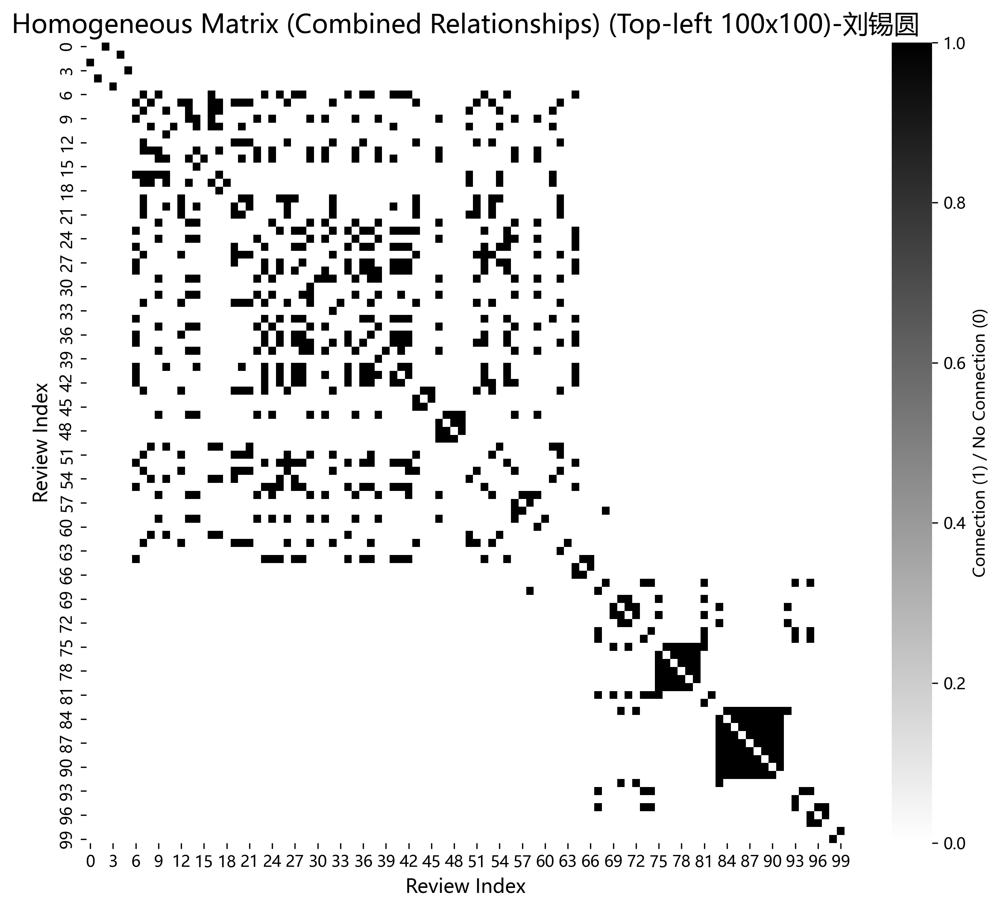

In [3]:
def plot_relationship_heatmap(matrix, title, max_size=100):
    # Convert sparse matrix to dense and select a small block for visualization
    if hasattr(matrix, "toarray"):
        matrix = matrix[:max_size, :max_size].toarray()
    else:
        matrix = matrix[:max_size, :max_size]
    plt.figure(figsize=(9, 8))
    # Use 'binary' cmap if the matrix contains only 0s and 1s, otherwise 'viridis'
    cmap = 'binary' if np.all(np.isin(matrix, [0, 1])) else 'viridis'
    sns.heatmap(matrix, cmap=cmap, cbar_kws={'label': 'Connection (1) / No Connection (0)'})
    plt.title(title + f" (Top-left {max_size}x{max_size})-刘锡圆", fontsize=16)
    plt.xlabel("Review Index", fontsize=12)
    plt.ylabel("Review Index", fontsize=12)
    plt.tight_layout()
    plt.show()

plot_relationship_heatmap(net_rur_matrix, 'R-U-R Matrix (Same User Reviews)')
plot_relationship_heatmap(net_rsr_matrix, 'R-S-R Matrix (Same Star Rating, Same Product)')
plot_relationship_heatmap(net_rtr_matrix, 'R-T-R Matrix (Same Month, Same Product)')
plot_relationship_heatmap(homo_matrix, 'Homogeneous Matrix (Combined Relationships)')

### 直方图的形状-YelpChi.mat
会告诉您大多数评论与其他评论的连接数量是多少。例如，如果直方图集中在较低的连接数，表示大多数评论只与少数其他评论有关系。
高连接评论的比例： 如果直方图的尾部较长或存在多个峰值，可能表示有一部分评论与其他评论有着异常多的连接。在欺诈检测中，一个评论与非常多的其他评论（尤其是通过同一用户、相同星级或相同时间发布）有关系，可能是欺诈团伙活动的迹象。
不同关系类型的特征： 比较 R-U-R、R-S-R、R-T-R 和 Homogeneous 矩阵的连接数直方图，您可以看出不同类型的关系在评论网络中的密度和分布特征。例如，R-U-R 可能显示某些用户发布了大量评论，导致这些评论之间有很高的连接数。

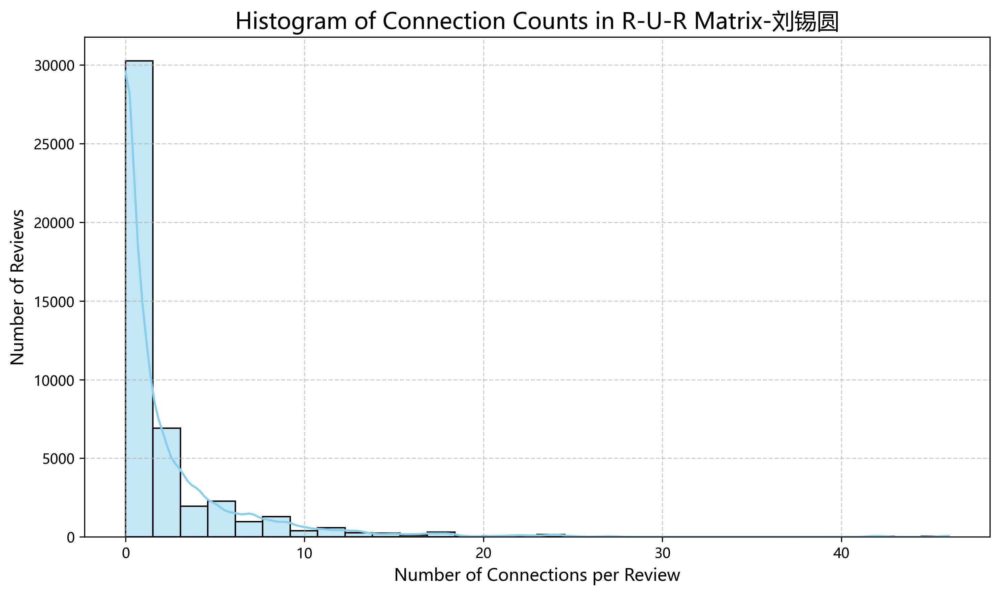

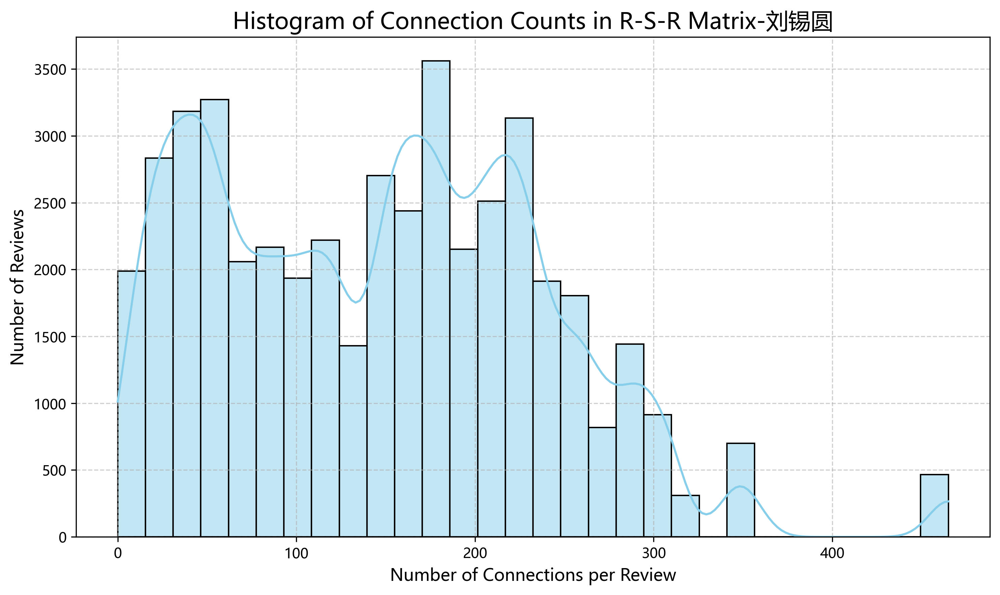

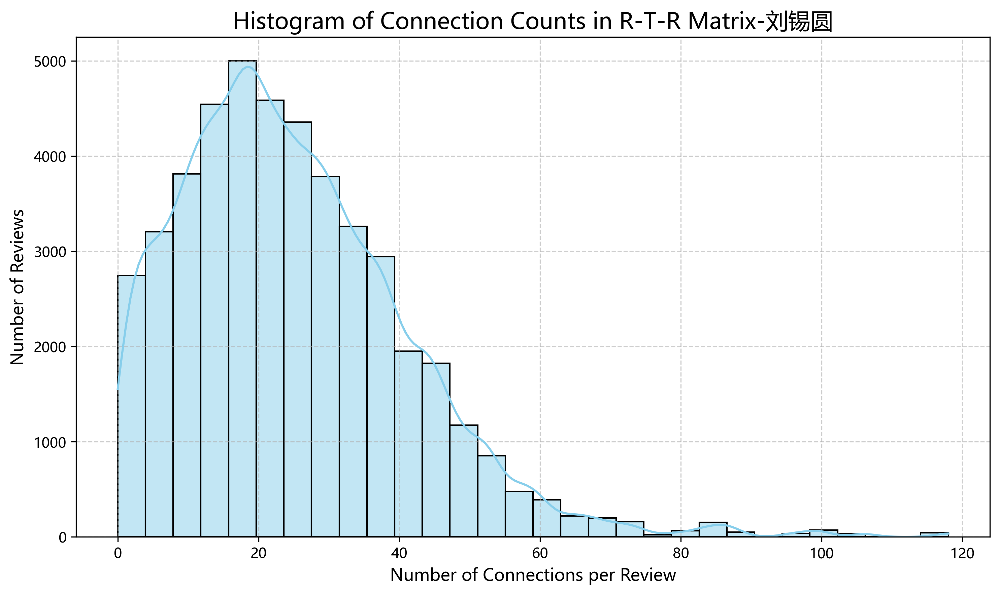

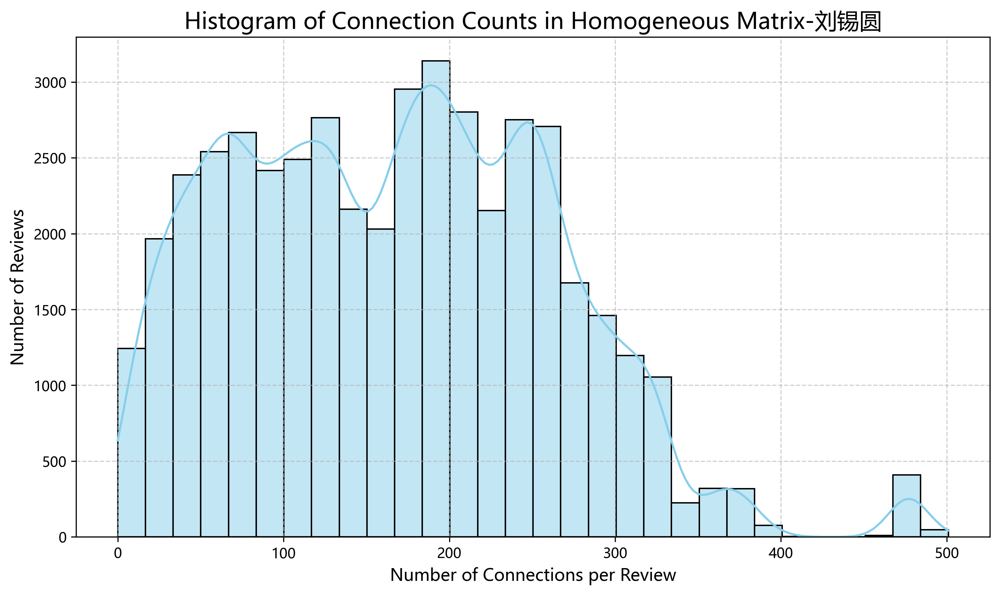

In [4]:
def plot_connection_counts_histogram(matrix, title):
    if hasattr(matrix, "toarray"):
        dense_matrix = matrix.toarray()
    else:
        dense_matrix = matrix
    connection_counts = dense_matrix.sum(axis=1) # Sum across rows

    plt.figure(figsize=(10, 6))
    sns.histplot(connection_counts, bins=30, kde=True, color='skyblue')
    plt.title(f'Histogram of Connection Counts in {title}-刘锡圆', fontsize=16)
    plt.xlabel("Number of Connections per Review", fontsize=12)
    plt.ylabel("Number of Reviews", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()
plot_connection_counts_histogram(net_rur_matrix, 'R-U-R Matrix')
plot_connection_counts_histogram(net_rsr_matrix, 'R-S-R Matrix')
plot_connection_counts_histogram(net_rtr_matrix, 'R-T-R Matrix')
plot_connection_counts_histogram(homo_matrix, 'Homogeneous Matrix')

### 降维特征数据-YelpChi.mat
高维特征数据投影到二维空间，并可视化这些降维后的数据点，同时根据评论的欺诈标签（labels）进行着色。

这样做是为了在无法直接可视化多于3维数据时，帮助我们观察欺诈评论和非欺诈评论在特征空间中是否存在可分离的模式或聚类。 

如果不同类别的点在降维后的空间中能明显地聚成不同的簇，那就表明这些特征对于区分欺诈和非欺诈行为是有效的。


--- Visualizing Features with Dimensionality Reduction ---


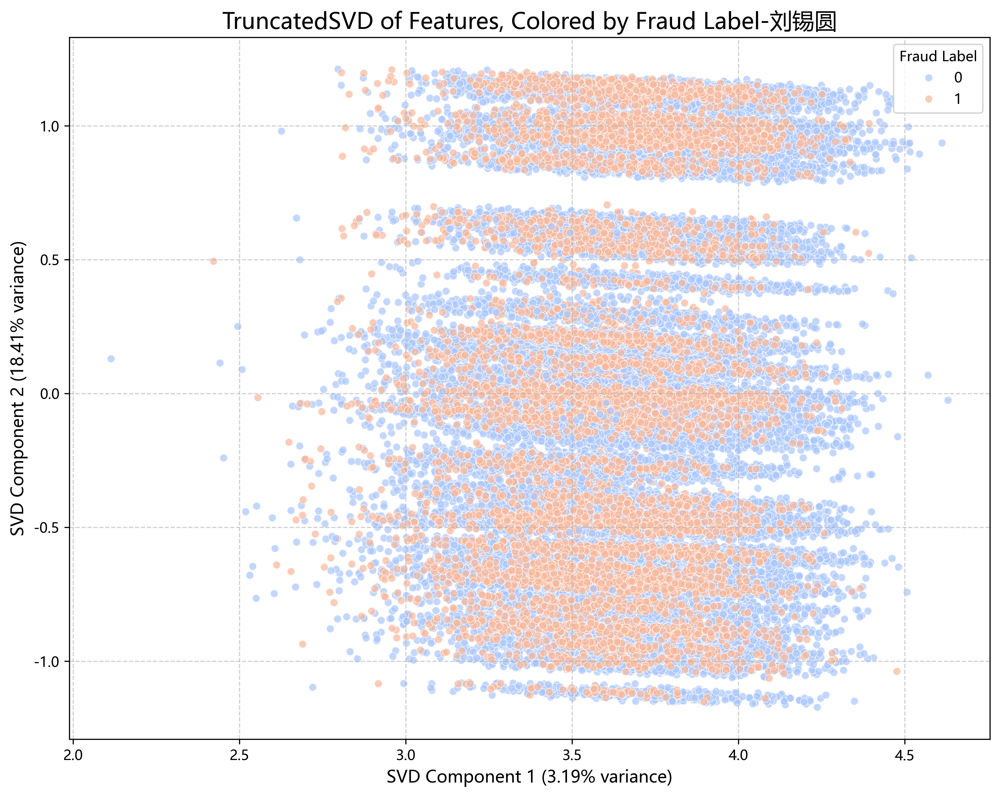


Dataset is large. t-SNE can be slow. Running on a sampled subset.
Applying t-SNE on a sample of 5000 reviews...


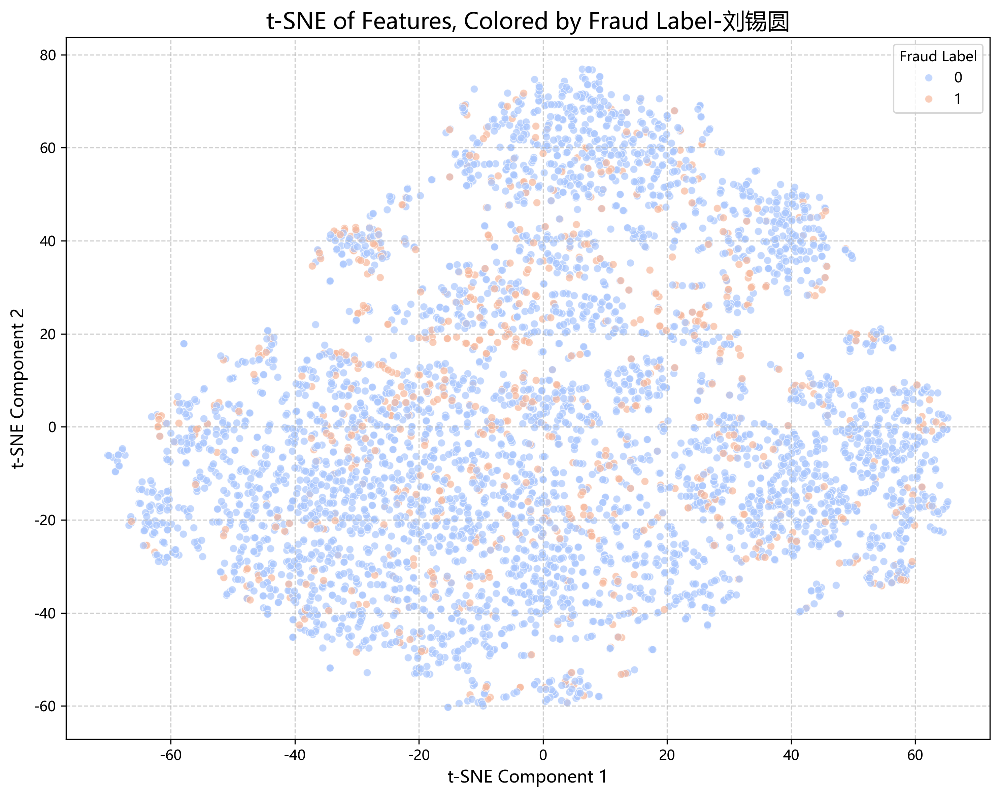

In [5]:
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE

print("\n--- Visualizing Features with Dimensionality Reduction ---")

if features_matrix.shape[1] > 2: 
    svd = TruncatedSVD(n_components=2, random_state=42)
    features_svd = svd.fit_transform(features_matrix)

    plt.figure(figsize=(10, 8))
    sns.scatterplot(x=features_svd[:, 0], y=features_svd[:, 1], hue=labels, palette='coolwarm', alpha=0.7, s=30)
    plt.title('TruncatedSVD of Features, Colored by Fraud Label-刘锡圆', fontsize=16)
    plt.xlabel(f'SVD Component 1 ({svd.explained_variance_ratio_[0]*100:.2f}% variance)', fontsize=12)
    plt.ylabel(f'SVD Component 2 ({svd.explained_variance_ratio_[1]*100:.2f}% variance)', fontsize=12)
    plt.legend(title='Fraud Label', loc='best')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()
else:
    print("Not enough features for SVD (less than 2 dimensions).")
if features_matrix.shape[0] > 1000 and features_matrix.shape[1] > 1: 
    print("\nDataset is large. t-SNE can be slow. Running on a sampled subset.")
    sample_size = 5000 # You can adjust this value (e.g., 2000, 3000, 4000, 5000)

    if features_matrix.shape[0] > sample_size:
        sample_indices = np.random.choice(features_matrix.shape[0], sample_size, replace=False)
        features_sample = features_matrix[sample_indices]
        labels_sample = labels[sample_indices]
    else:
        features_sample = features_matrix
        labels_sample = labels

    print(f"Applying t-SNE on a sample of {features_sample.shape[0]} reviews...")
    tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_jobs=-1) # Adjust perplexity (often 5-50)
    features_sample_dense = features_sample.toarray()
    features_tsne = tsne.fit_transform(features_sample_dense)

    current_labels = labels_sample

    plt.figure(figsize=(10, 8))
    sns.scatterplot(x=features_tsne[:, 0], y=features_tsne[:, 1], hue=current_labels, palette='coolwarm', alpha=0.7, s=30)
    plt.title('t-SNE of Features, Colored by Fraud Label-刘锡圆', fontsize=16) # Add "Sampled Data" to title
    plt.xlabel('t-SNE Component 1', fontsize=12)
    plt.ylabel('t-SNE Component 2', fontsize=12)
    plt.legend(title='Fraud Label', loc='best')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

else:
    print("Not enough data points or features for meaningful t-SNE visualization.")

## Amazon.mat

In [6]:
try:
    amazon_data = scipy.io.loadmat('./data/Amazon.mat')
    print("\nAmazon Data loaded successfully!")
    print("Available keys for Amazon:", amazon_data.keys())
except FileNotFoundError:
    print("Error: Amazon.mat not found. Make sure the file is in './data/'.")
    exit()
homo_matrix_amazon = amazon_data['homo']
net_upu_matrix_amazon = amazon_data['net_upu']
net_usu_matrix_amazon = amazon_data['net_usu']
net_uvu_matrix_amazon = amazon_data['net_uvu']
features_matrix_amazon = amazon_data['features']
labels_amazon = amazon_data['label'].flatten() 


Amazon Data loaded successfully!
Available keys for Amazon: dict_keys(['__header__', '__version__', '__globals__', 'homo', 'net_upu', 'net_usu', 'net_uvu', 'features', 'label'])



--- Visualizing Relationship Matrices (Amazon.mat) ---


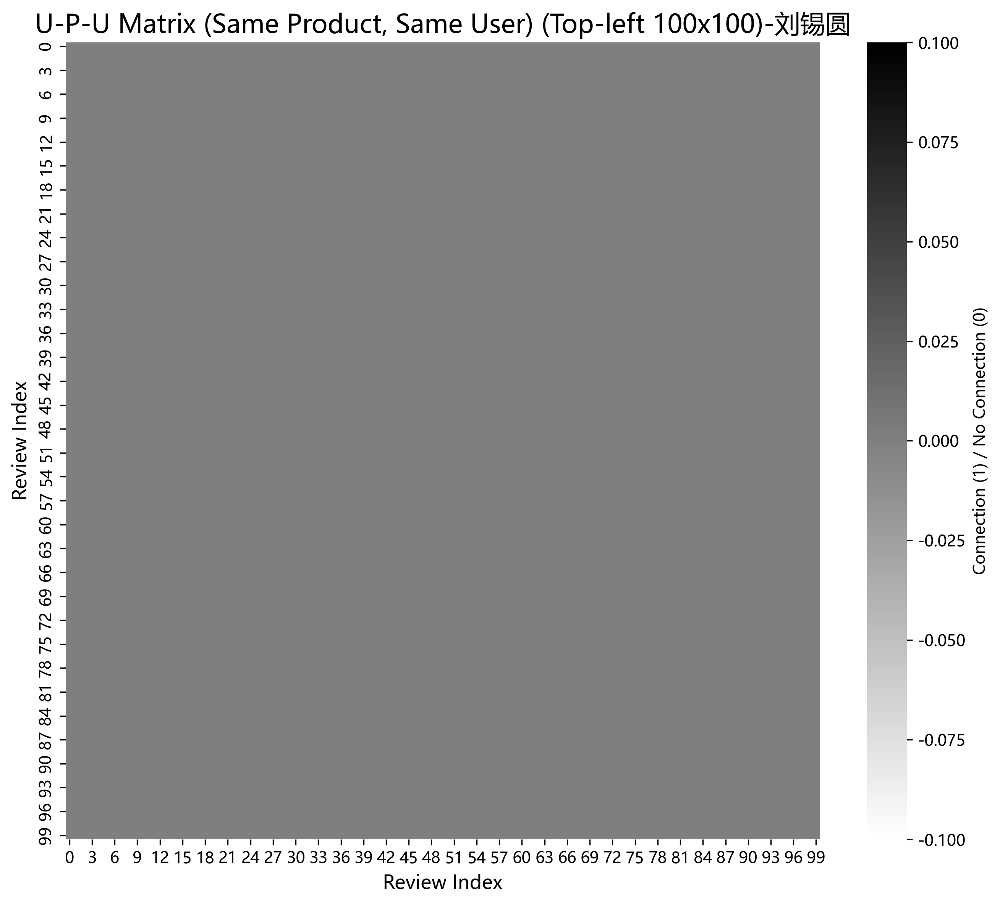

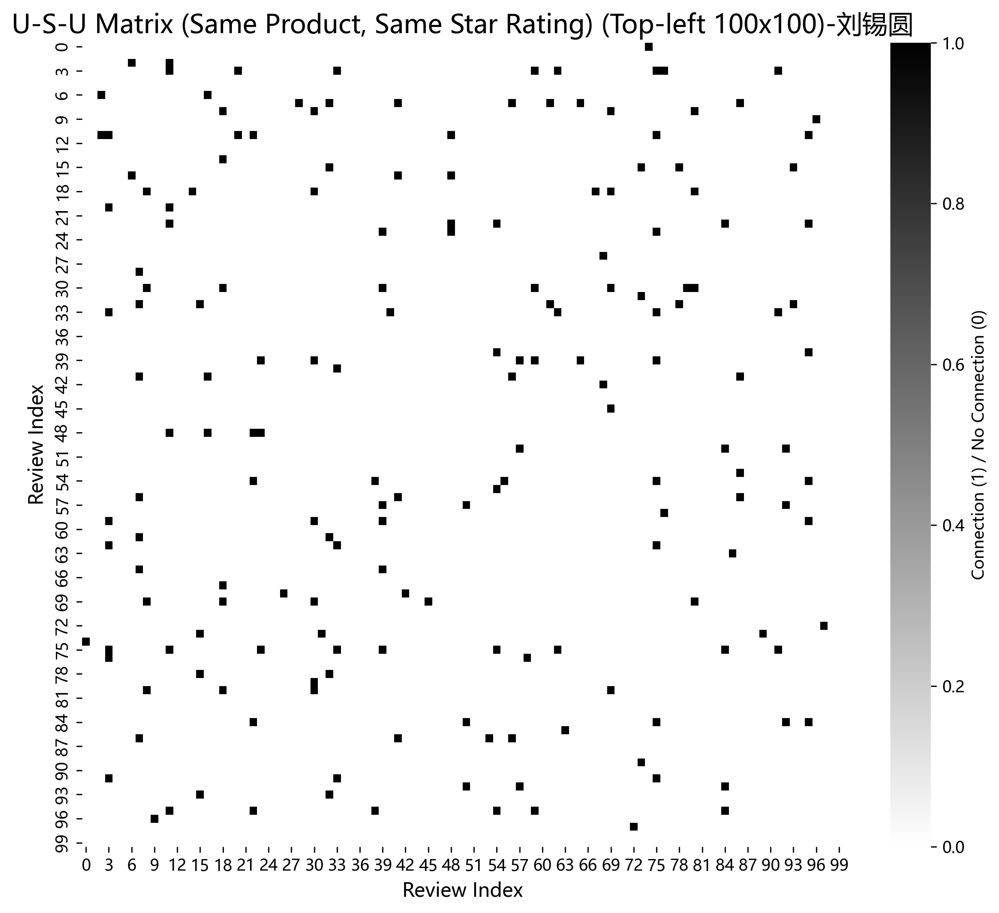

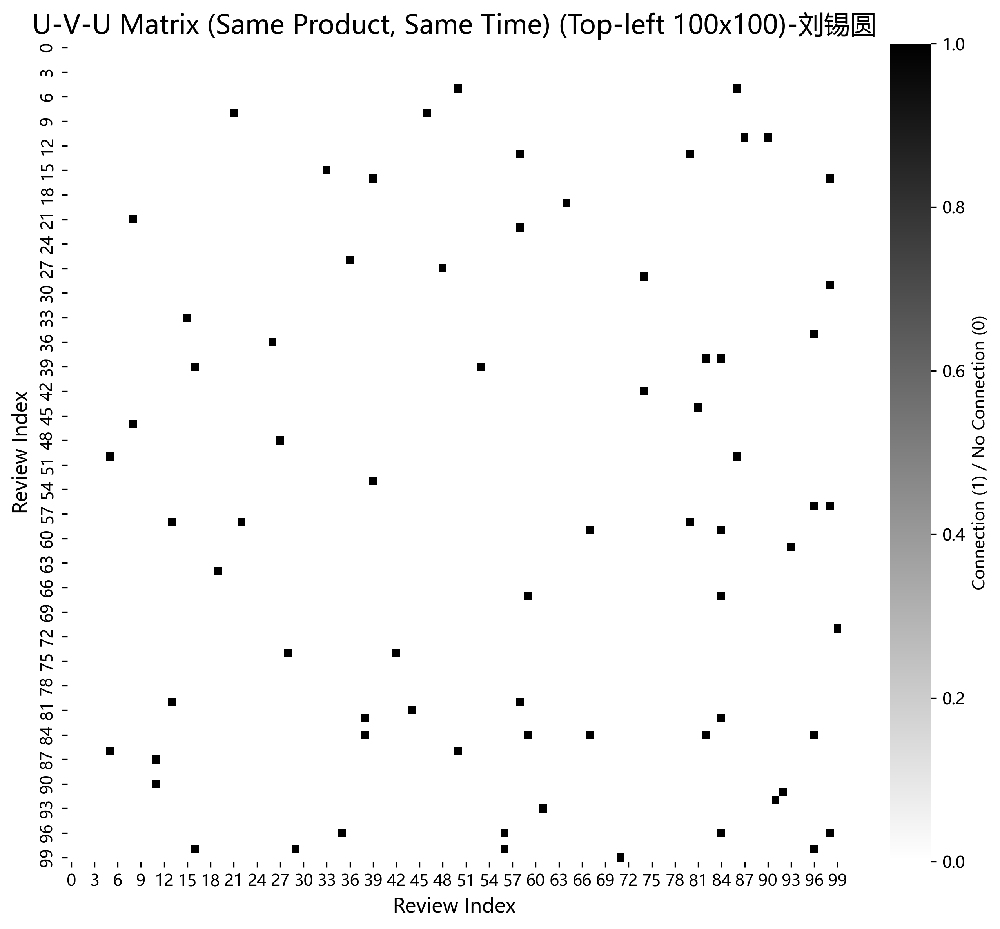

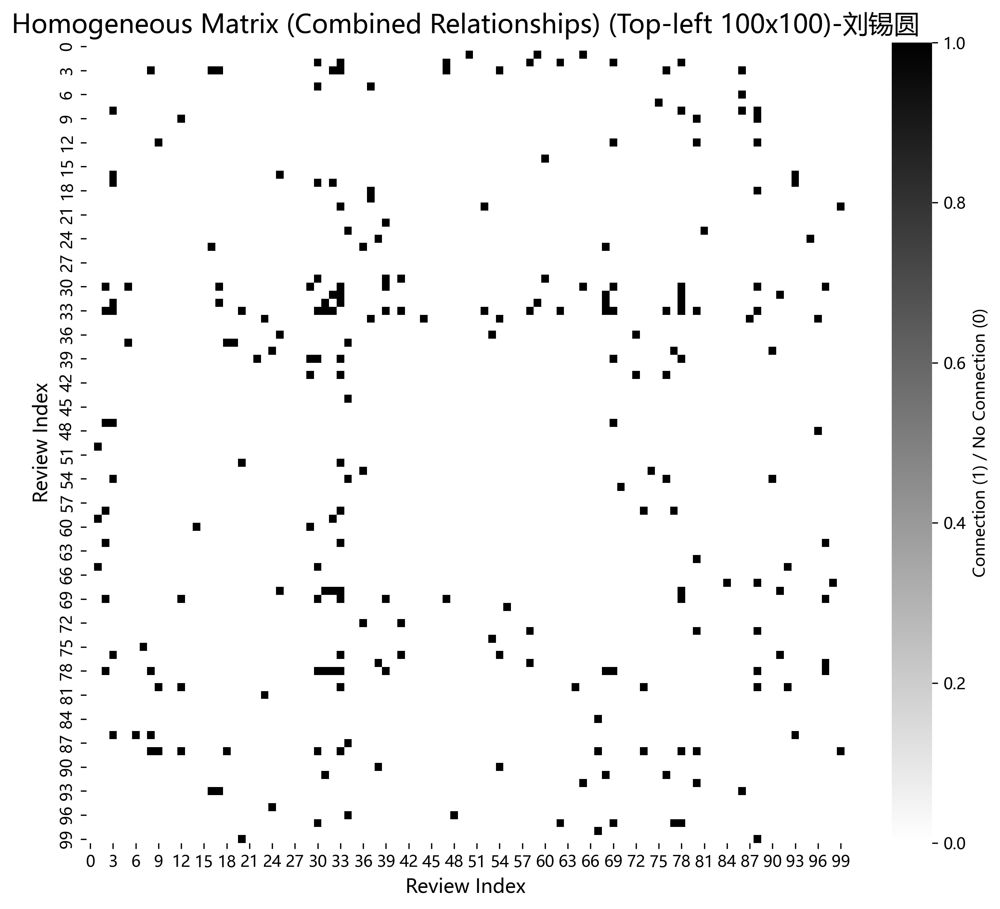

In [7]:
print("\n--- Visualizing Relationship Matrices (Amazon.mat) ---")
plot_relationship_heatmap(net_upu_matrix_amazon, 'U-P-U Matrix (Same Product, Same User)')
plot_relationship_heatmap(net_usu_matrix_amazon, 'U-S-U Matrix (Same Product, Same Star Rating)')
plot_relationship_heatmap(net_uvu_matrix_amazon, 'U-V-U Matrix (Same Product, Same Time)')
plot_relationship_heatmap(homo_matrix_amazon, 'Homogeneous Matrix (Combined Relationships)')


### 直方图的形状-Amazon.mat

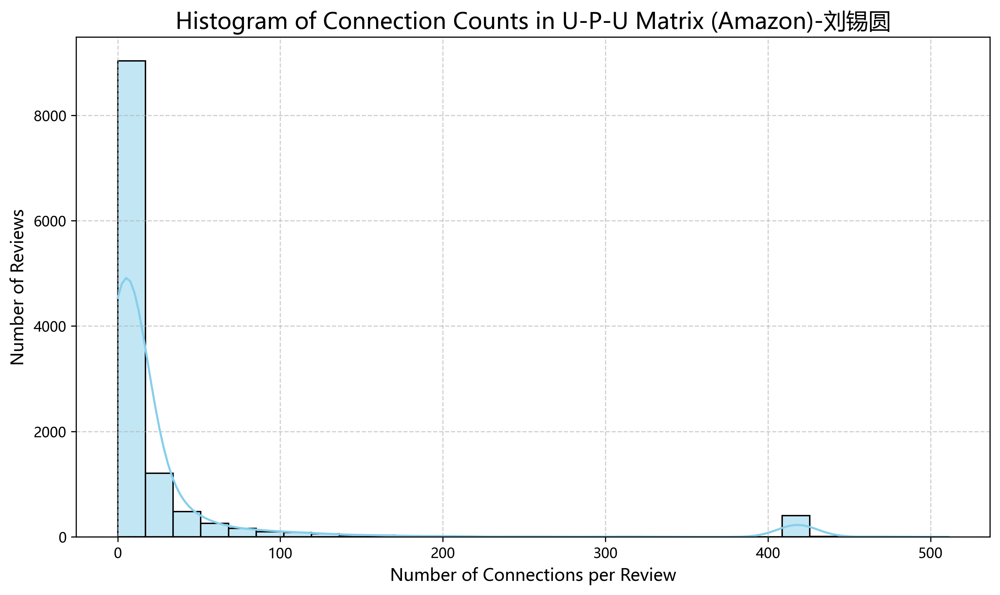

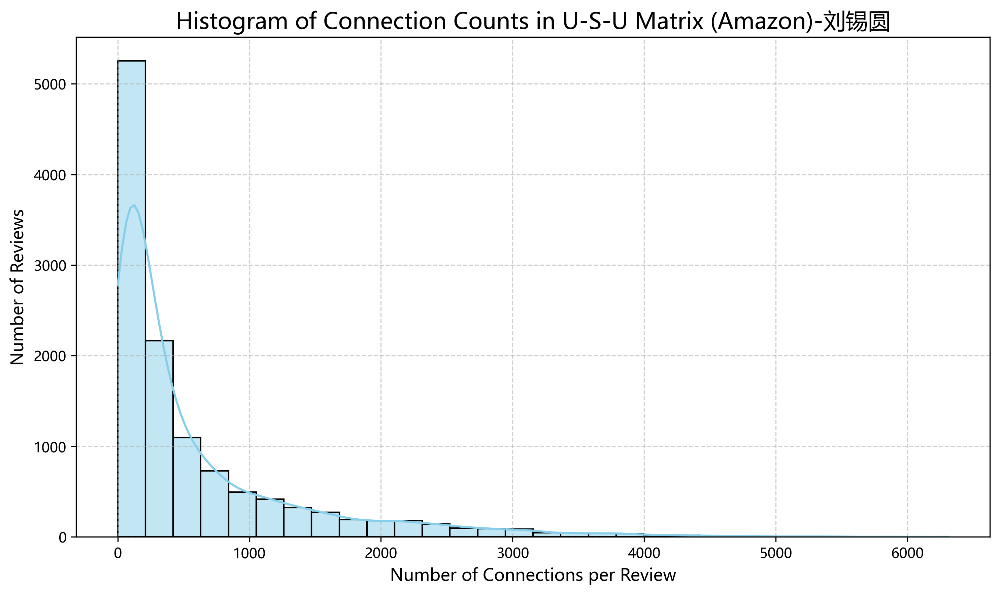

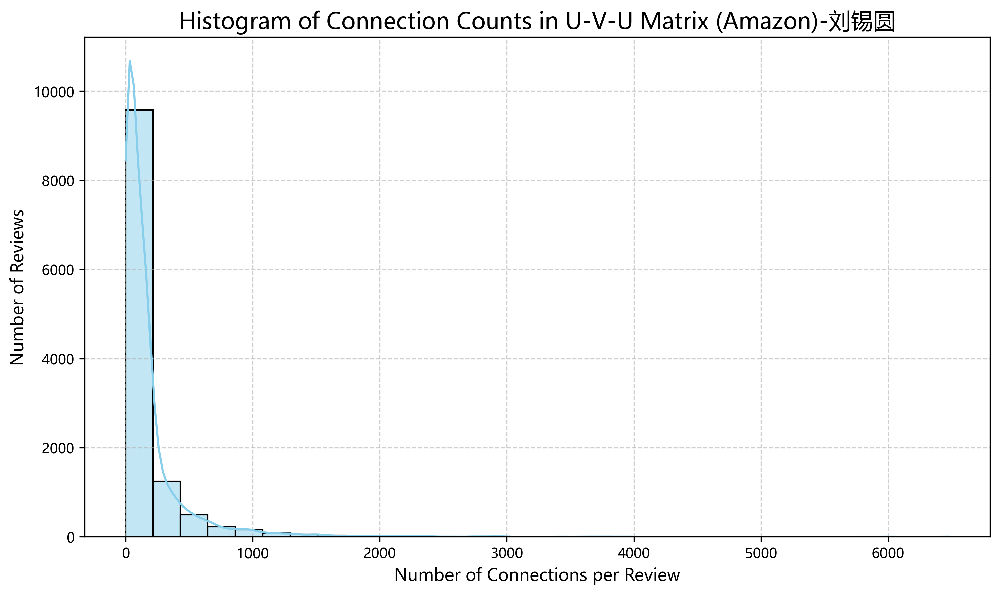

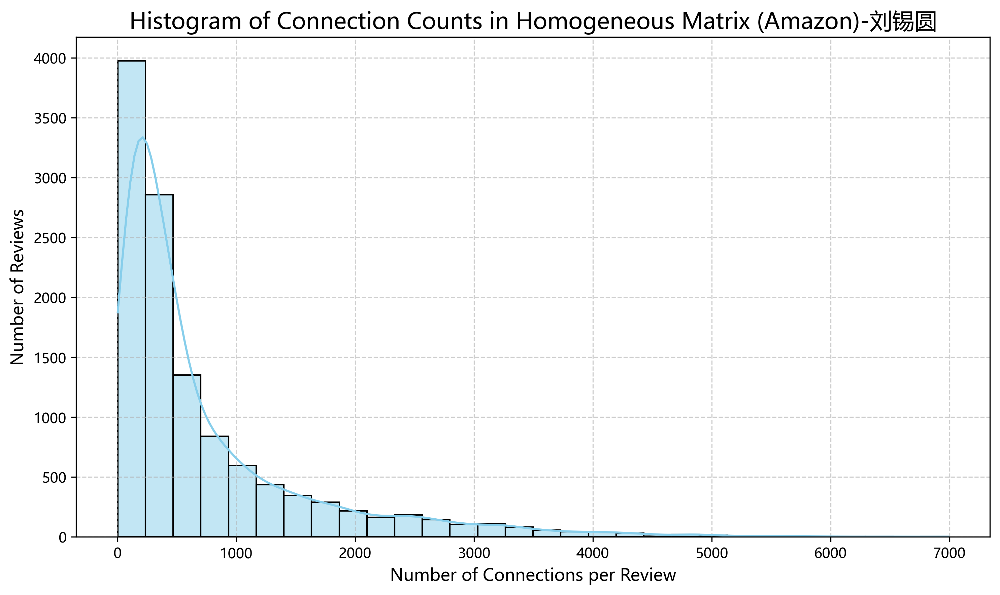

In [8]:
plot_connection_counts_histogram(net_upu_matrix_amazon, 'U-P-U Matrix (Amazon)')
plot_connection_counts_histogram(net_usu_matrix_amazon, 'U-S-U Matrix (Amazon)')
plot_connection_counts_histogram(net_uvu_matrix_amazon, 'U-V-U Matrix (Amazon)')
plot_connection_counts_histogram(homo_matrix_amazon, 'Homogeneous Matrix (Amazon)')


### 降维特征数据-Amazon.mat

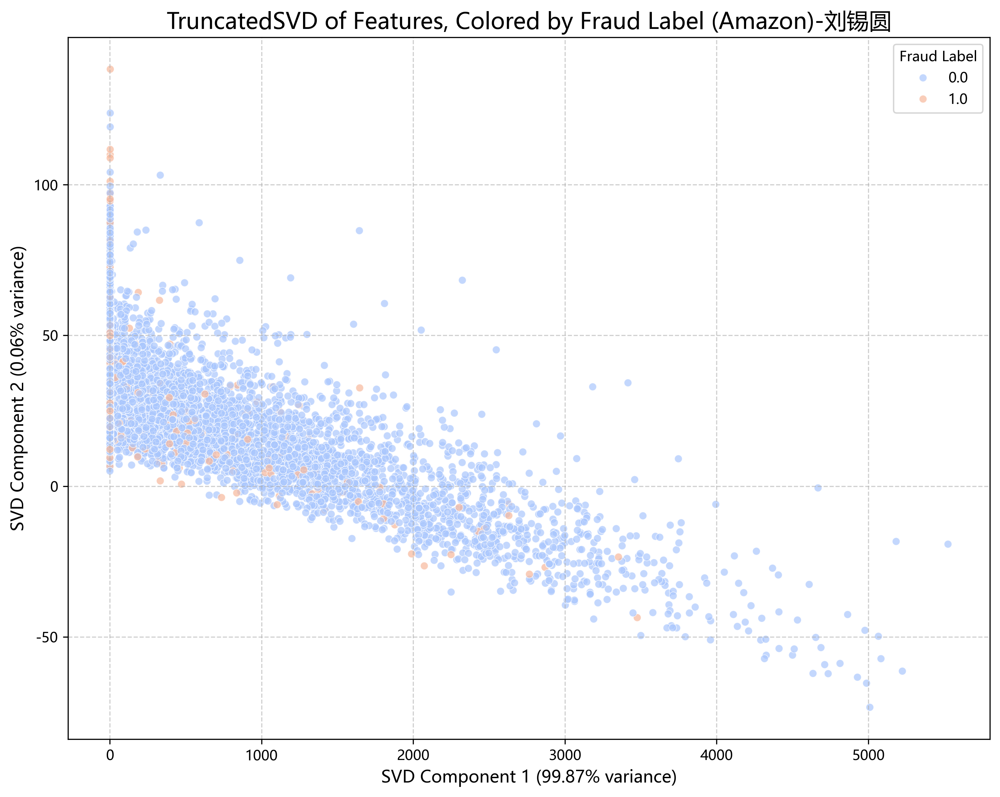


Dataset (Amazon) is large. t-SNE can be slow. Running on a sampled subset.
Applying t-SNE on a sample of 5000 reviews from Amazon...


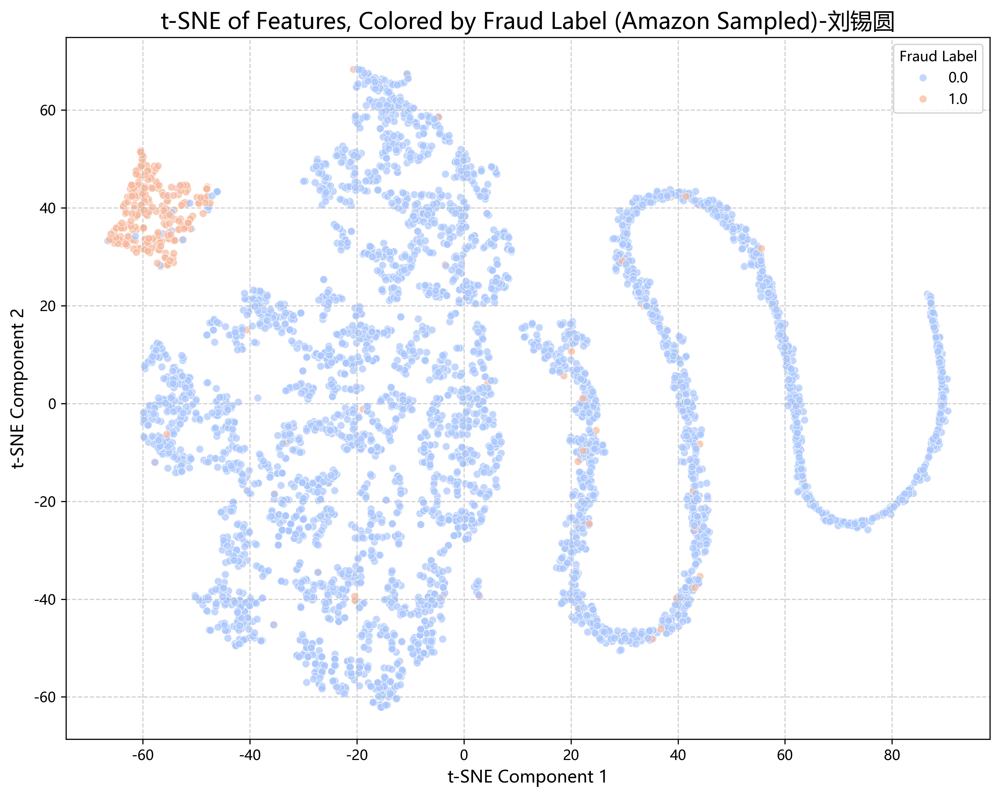

In [9]:
if features_matrix_amazon.shape[1] > 2:
    svd = TruncatedSVD(n_components=2, random_state=42)
    features_svd_amazon = svd.fit_transform(features_matrix_amazon)

    plt.figure(figsize=(10, 8))
    sns.scatterplot(x=features_svd_amazon[:, 0], y=features_svd_amazon[:, 1], hue=labels_amazon, palette='coolwarm', alpha=0.7, s=30)
    plt.title('TruncatedSVD of Features, Colored by Fraud Label (Amazon)-刘锡圆', fontsize=16)
    plt.xlabel(f'SVD Component 1 ({svd.explained_variance_ratio_[0]*100:.2f}% variance)', fontsize=12)
    plt.ylabel(f'SVD Component 2 ({svd.explained_variance_ratio_[1]*100:.2f}% variance)', fontsize=12)
    plt.legend(title='Fraud Label', loc='best')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()
else:
    print("Not enough features for SVD (less than 2 dimensions) for Amazon.")

if features_matrix_amazon.shape[0] > 1000 and features_matrix_amazon.shape[1] > 1:
    print("\nDataset (Amazon) is large. t-SNE can be slow. Running on a sampled subset.")

    np.random.seed(42) 
    sample_size_amazon = 5000 

    if features_matrix_amazon.shape[0] > sample_size_amazon:
        sample_indices_amazon = np.random.choice(features_matrix_amazon.shape[0], sample_size_amazon, replace=False)
        features_sample_amazon = features_matrix_amazon[sample_indices_amazon]
        labels_sample_amazon = labels_amazon[sample_indices_amazon]
    else:
        features_sample_amazon = features_matrix_amazon
        labels_sample_amazon = labels_amazon

    print(f"Applying t-SNE on a sample of {features_sample_amazon.shape[0]} reviews from Amazon...")
    tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_jobs=-1)

    features_sample_dense_amazon = features_sample_amazon.toarray()
    features_tsne_amazon = tsne.fit_transform(features_sample_dense_amazon)

    current_labels_amazon = labels_sample_amazon

    plt.figure(figsize=(10, 8))
    sns.scatterplot(x=features_tsne_amazon[:, 0], y=features_tsne_amazon[:, 1], hue=current_labels_amazon, palette='coolwarm', alpha=0.7, s=30)
    plt.title('t-SNE of Features, Colored by Fraud Label (Amazon Sampled)-刘锡圆', fontsize=16)
    plt.xlabel('t-SNE Component 1', fontsize=12)
    plt.ylabel('t-SNE Component 2', fontsize=12)
    plt.legend(title='Fraud Label', loc='best')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()
else:
    print("Not enough data points or features for meaningful t-SNE visualization for Amazon.")


In [1]:
from nbconvert import HTMLExporter
import nbformat
 
# 加载notebook文件
with open('DataAnalysis.ipynb') as f:
    nb = nbformat.read(f, as_version=4)
 
# 创建HTML导出器实例
html_exporter = HTMLExporter()
html, resources = html_exporter.from_notebook_node(nb)
 
# 写入HTML文件
with open('DataAnalysis.html', 'w') as f:
    f.write(html)